In [ ]:
!pip install -q tensorflowjs
!pip install -q kaggle

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 1.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
db-dtypes 1.4.3 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.
google-cloud-bigquery 3.32.0 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.


In [ ]:
import os
import subprocess
import random
import shutil
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import Sequential, layers
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping, TensorBoard
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam
from keras.preprocessing import image
from google.colab import files

%load_ext tensorboard
!rm -rf ./logs/

In [ ]:
files.upload()

!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d vipoooool/new-plant-diseases-dataset
!unzip -q new-plant-diseases-dataset.zip -d plant_dataset

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset
License(s): copyright-authors
 98% 2.65G/2.70G [00:16<00:00, 161MB/s]
100% 2.70G/2.70G [00:16<00:00, 179MB/s]


In [ ]:
def split_dataset(base_dir, split_base, val_ratio=0.15, test_ratio=0.15, seed=42):
    """
    Split the dataset into train, validation, and test sets.

    Args:
        base_dir (str): Path to the original dataset.
        split_base (str): Path to the output split dataset.
        val_ratio (float): Ratio for validation set.
        test_ratio (float): Ratio for test set.
        seed (int): Random seed for reproducibility.
    """
    random.seed(seed)
    train_dir = os.path.join(split_base, 'train')
    val_dir = os.path.join(split_base, 'val')
    test_dir = os.path.join(split_base, 'test')

    for d in [train_dir, val_dir, test_dir]:
        os.makedirs(d, exist_ok=True)

    for class_name in os.listdir(base_dir):
        class_path = os.path.join(base_dir, class_name)
        if not os.path.isdir(class_path):
            continue
        images = os.listdir(class_path)
        random.shuffle(images)
        n_total = len(images)
        n_val = int(n_total * val_ratio)
        n_test = int(n_total * test_ratio)
        n_train = n_total - n_val - n_test

        splits = {
            train_dir: images[:n_train],
            val_dir: images[n_train:n_train+n_val],
            test_dir: images[n_train+n_val:]
        }

        for split_dir, split_files in splits.items():
            split_class_dir = os.path.join(split_dir, class_name)
            os.makedirs(split_class_dir, exist_ok=True)
            for fname in split_files:
                src = os.path.join(class_path, fname)
                dst = os.path.join(split_class_dir, fname)
                if not os.path.exists(dst):
                    shutil.copy2(src, dst)

    print("Splitting done. Example train images in one class:",
          len(os.listdir(os.path.join(train_dir, os.listdir(base_dir)[0]))))

base_dir = '/content/plant_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'
split_base = '/content/plant_split'
split_dataset(base_dir, split_base)

Splitting done. Example train images in one class: 1335


In [ ]:
def create_data_generators(split_base, img_size, batch_size):
    """
    Create training, validation, and test data generators.

    Args:
        split_base (str): Path to the split dataset.
        img_size (int): Target image size.
        batch_size (int): Batch size.

    Returns:
        tuple: (train_generator, val_generator, test_generator, class_labels)
    """
    train_dir = os.path.join(split_base, 'train')
    val_dir = os.path.join(split_base, 'val')
    test_dir = os.path.join(split_base, 'test')

    train_datagen = ImageDataGenerator(rescale=1./255)
    val_datagen = ImageDataGenerator(rescale=1./255)
    test_datagen = ImageDataGenerator(rescale=1./255)

    train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(img_size, img_size),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=batch_size,
        shuffle=True
    )
    val_generator = val_datagen.flow_from_directory(
        val_dir,
        target_size=(img_size, img_size),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=batch_size,
        shuffle=False
    )
    test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(img_size, img_size),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=batch_size,
        shuffle=False
    )
    class_labels = list(train_generator.class_indices.keys())
    print("Class labels:")
    for i, label in enumerate(class_labels):
        print(f"{i + 1}. {label}")
    print(f"Total number of classes: {len(class_labels)}")
    return train_generator, val_generator, test_generator, class_labels

IMG_SIZE = 128
BATCH_SIZE = 32
train_gen, val_gen, test_gen, class_labels = create_data_generators(split_base, IMG_SIZE, BATCH_SIZE)

Found 49237 images belonging to 38 classes.
Found 10529 images belonging to 38 classes.
Found 10529 images belonging to 38 classes.
Class labels:
1. Apple___Apple_scab
2. Apple___Black_rot
3. Apple___Cedar_apple_rust
4. Apple___healthy
5. Blueberry___healthy
6. Cherry_(including_sour)___Powdery_mildew
7. Cherry_(including_sour)___healthy
8. Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
9. Corn_(maize)___Common_rust_
10. Corn_(maize)___Northern_Leaf_Blight
11. Corn_(maize)___healthy
12. Grape___Black_rot
13. Grape___Esca_(Black_Measles)
14. Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
15. Grape___healthy
16. Orange___Haunglongbing_(Citrus_greening)
17. Peach___Bacterial_spot
18. Peach___healthy
19. Pepper,_bell___Bacterial_spot
20. Pepper,_bell___healthy
21. Potato___Early_blight
22. Potato___Late_blight
23. Potato___healthy
24. Raspberry___healthy
25. Soybean___healthy
26. Squash___Powdery_mildew
27. Strawberry___Leaf_scorch
28. Strawberry___healthy
29. Tomato___Bacterial_spot
30. T

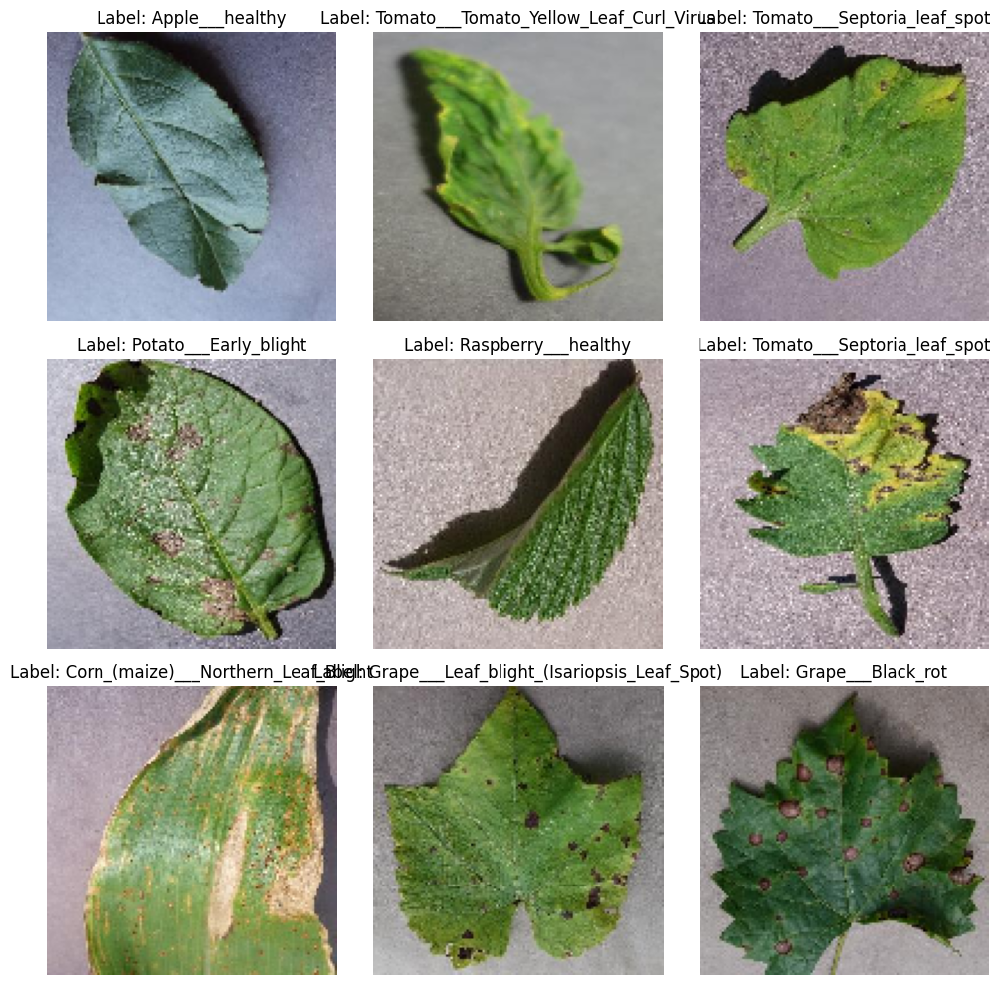

In [ ]:
def plot_sample_images(generator, class_labels, n=9):
    """
    Plot sample images from a data generator.

    Args:
        generator: Keras ImageDataGenerator instance.
        class_labels (list): List of class names.
        n (int): Number of images to plot.
    """
    images, labels = next(generator)
    plt.figure(figsize=(10, 10))
    for i in range(n):
        plt.subplot(3, 3, i+1)
        plt.imshow(images[i])
        label_idx = np.argmax(labels[i])
        plt.title(f"Label: {class_labels[label_idx]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

plot_sample_images(train_gen, class_labels)

In [ ]:
def build_cnn_model(input_shape, num_classes, weight_decay=1e-3):
    """
    Build a Sequential CNN model with Conv2D and Pooling layers.

    Args:
        input_shape (tuple): Shape of input images.
        num_classes (int): Number of output classes.
        weight_decay (float): L2 regularization factor.

    Returns:
        tf.keras.Model: Compiled CNN model.
    """
    model = Sequential([
        layers.Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l2(weight_decay), input_shape=input_shape),
        layers.BatchNormalization(),
        layers.Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l2(weight_decay)),
        layers.BatchNormalization(),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Dropout(0.25),

        layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(weight_decay)),
        layers.BatchNormalization(),
        layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(weight_decay)),
        layers.BatchNormalization(),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Dropout(0.25),

        layers.Flatten(),
        layers.Dense(256, activation='relu', kernel_regularizer=l2(weight_decay)),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer=Adam(learning_rate=1e-3),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

model = build_cnn_model((IMG_SIZE, IMG_SIZE, 3), len(class_labels))
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 126, 126, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 124, 124, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 124, 124, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 60, 60, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 58, 58, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 58, 58, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 29, 29, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 29, 29, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 53824)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    13,779,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 38)             │         9,766 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,856,326 (52.86 MB)

 Trainable params: 13,855,430 (52.85 MB)

 Non-trainable params: 896 (3.50 KB)

In [ ]:
def get_callbacks(model_dir='keras_model'):
    """
    Create a list of callbacks for model training.

    Args:
        model_dir (str): Directory to save the best model.

    Returns:
        list: List of Keras callbacks.
    """
    os.makedirs(model_dir, exist_ok=True)
    checkpoint = ModelCheckpoint(
        filepath=os.path.join(model_dir, 'best_model.keras'),
        monitor='val_accuracy',
        save_best_only=True,
        mode='max'
    )
    reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=3, verbose=1)
    early_stopping = EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
    logdir = "logs/fit/" + datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = TensorBoard(log_dir=logdir)
    return [tensorboard_callback, checkpoint, early_stopping, reduce_lr]

callbacks = get_callbacks()

In [ ]:
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=100,
    callbacks=callbacks,
    verbose=1
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
1539/1539 ━━━━━━━━━━━━━━━━━━━━ 101s 56ms/step - accuracy: 0.5195 - loss: 3.0164 - val_accuracy: 0.7501 - val_loss: 2.1201 - learning_rate: 0.0010
Epoch 2/100
1539/1539 ━━━━━━━━━━━━━━━━━━━━ 76s 49ms/step - accuracy: 0.7636 - loss: 2.1667 - val_accuracy: 0.4105 - val_loss: 4.5477 - learning_rate: 0.0010
Epoch 3/100
1539/1539 ━━━━━━━━━━━━━━━━━━━━ 86s 56ms/step - accuracy: 0.8129 - loss: 2.3468 - val_accuracy: 0.8379 - val_loss: 2.5294 - learning_rate: 0.0010
Epoch 4/100
1539/1539 ━━━━━━━━━━━━━━━━━━━━ 131s 48ms/step - accuracy: 0.8406 - loss: 2.3913 - val_accuracy: 0.7892 - val_loss: 2.6591 - learning_rate: 0.0010
Epoch 5/100
1539/1539 ━━━━━━━━━━━━━━━━━━━━ 82s 48ms/step - accuracy: 0.8550 - loss: 2.3911 - val_accuracy: 0.7480 - val_loss: 2.9371 - learning_rate: 0.0010
Epoch 6/100
1538/1539 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.8664 - loss: 2.3724
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
1539/1539 ━━━━━━━━━━━━━━━━━━━━ 75s 49ms/step - 

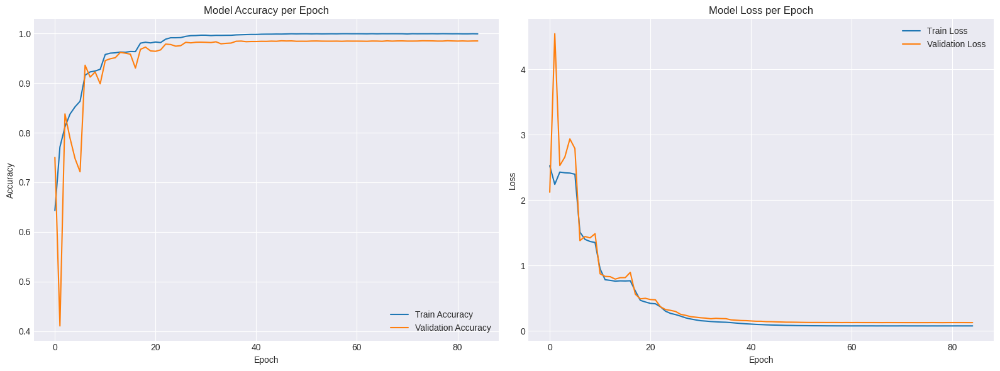

In [ ]:
def plot_training_history(history):
    """
    Plot training and validation accuracy and loss from the training history.

    Args:
        history (keras.callbacks.History):
            The History object returned by model.fit().
    """
    plt.style.use("seaborn-v0_8-darkgrid")
    fig, ax = plt.subplots(1, 2, figsize=(16, 6))

    ax[0].plot(history.history["accuracy"], label="Train Accuracy")
    ax[0].plot(history.history["val_accuracy"], label="Validation Accuracy")
    ax[0].set_title("Model Accuracy per Epoch")
    ax[0].set_xlabel("Epoch")
    ax[0].set_ylabel("Accuracy")
    ax[0].legend()

    ax[1].plot(history.history["loss"], label="Train Loss")
    ax[1].plot(history.history["val_loss"], label="Validation Loss")
    ax[1].set_title("Model Loss per Epoch")
    ax[1].set_xlabel("Epoch")
    ax[1].set_ylabel("Loss")
    ax[1].legend()

    plt.tight_layout()
    plt.show()

plot_training_history(history)

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
def evaluate_model(model_path, train_gen, test_gen, min_acc=0.95):
    """
    Load a trained model and evaluate its performance on training and test datasets.

    Args:
        model_path (str):
            Path to the saved Keras model (.keras file).
        train_gen (tf.keras.utils.Sequence):
            Data generator for the training set.
        test_gen (tf.keras.utils.Sequence):
            Data generator for the test set.
        min_acc (float, optional):
            Minimum acceptable accuracy for both train and test sets. Default is 0.95 (95%).

    Returns:
        tuple: A tuple containing (train_acc, test_acc), both as floats between 0 and 1.

    Raises:
        AssertionError: If either train or test accuracy is below `min_acc`.
    """

    model = load_model(model_path)

    train_loss, train_acc = model.evaluate(train_gen, verbose=0)
    test_loss, test_acc = model.evaluate(test_gen, verbose=0)

    print(f"Train Accuracy: {train_acc * 100:.2f}%")
    print(f"Test Accuracy : {test_acc  * 100:.2f}%")

    assert train_acc >= min_acc and test_acc >= min_acc, (
        f"Both train and test accuracy must be at least {min_acc * 100:.0f}%!"
    )

    return train_acc, test_acc

train_acc, test_acc = evaluate_model("keras_model/best_model.keras", train_gen, test_gen)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Train Accuracy: 100.00%
Test Accuracy : 98.62%


330/330 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step


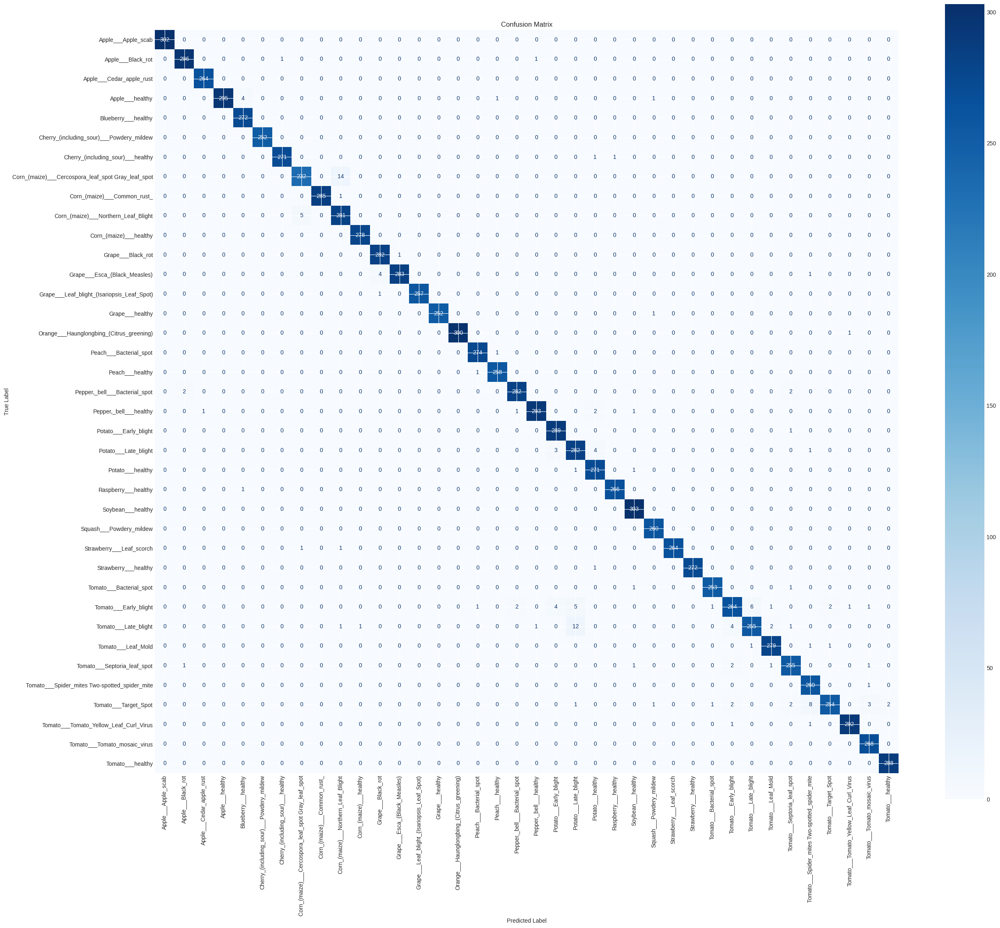

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      1.00      1.00       302
                                 Apple___Black_rot       0.99      0.99      0.99       298
                          Apple___Cedar_apple_rust       1.00      1.00      1.00       264
                                   Apple___healthy       1.00      0.98      0.99       301
                               Blueberry___healthy       0.98      1.00      0.99       272
          Cherry_(including_sour)___Powdery_mildew       1.00      1.00      1.00       252
                 Cherry_(including_sour)___healthy       1.00      0.99      0.99       273
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.97      0.94      0.96       246
                       Corn_(maize)___Common_rust_       1.00      1.00      1.00       286
               Corn_(maize)___Northern_Leaf_Blight       0.94      0.98      0.

In [ ]:
def plot_confusion_and_report(model_path, test_gen, class_labels):
    """
    Plot confusion matrix and print classification report for the best model.

    Args:
        model_path (str): Path to the saved best model (.keras).
        test_gen: Test data generator.
        class_labels (list): List of class names.
    """
    model = load_model(model_path)
    test_gen.reset()
    predictions = model.predict(test_gen, verbose=1)
    predicted_classes = np.argmax(predictions, axis=1)
    true_classes = test_gen.classes

    cm = confusion_matrix(true_classes, predicted_classes)

    fig_width = max(10, len(class_labels) * 0.7)
    fig_height = max(8, len(class_labels) * 0.6)
    fig, ax = plt.subplots(figsize=(fig_width, fig_height))

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
    disp.plot(ax=ax, cmap=plt.cm.Blues, values_format='d', xticks_rotation=90)
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.tight_layout()
    plt.show()

    report = classification_report(true_classes, predicted_classes, target_names=class_labels)
    print(report)

plot_confusion_and_report('keras_model/best_model.keras', test_gen, class_labels)

In [ ]:
def export_saved_model(model, export_dir: str) -> None:
    """
    Export a TensorFlow model to the SavedModel format.

    Args:
        model: The TensorFlow or Keras model to export.
        export_dir (str): Directory where the SavedModel will be saved.

    Raises:
        Exception: If the export process fails.
    """
    try:
        model.export(export_dir)
        print(f"Model successfully exported to SavedModel at: {export_dir}")
    except Exception as e:
        raise Exception(f"Failed to export SavedModel: {e}")

export_saved_model(model, "/content/saved_model")

Saved artifact at '/content/saved_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 38), dtype=tf.float32, name=None)
Captures:
  140684021194320: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140684021193936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140684021195856: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140684021193168: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140684021196432: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140684021195472: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140684021192976: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140684021193552: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140683930911568: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140683930911760: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140683930

In [ ]:
def convert_saved_model_to_tflite(saved_model_dir: str, tflite_path: str) -> None:
    """
    Convert a SavedModel to TensorFlow Lite format and save it as a .tflite file.

    Args:
        saved_model_dir (str): Path to the SavedModel directory.
        tflite_path (str): Path where the .tflite file will be saved.

    Raises:
        Exception: If the conversion process fails.
    """
    try:
        converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)
        tflite_model = converter.convert()
        with open(tflite_path, 'wb') as f:
            f.write(tflite_model)
        print(f"TFLite model successfully saved to: {tflite_path}")
    except Exception as e:
        raise Exception(f"Failed to convert to TFLite: {e}")

convert_saved_model_to_tflite("/content/saved_model", "/content/model.tflite")

TFLite model successfully saved to: /content/model.tflite


In [ ]:
def convert_saved_model_to_tfjs(saved_model_dir: str, tfjs_dir: str, output_node_names: str, saved_model_tags: str = "serve") -> None:
    """
    Convert a SavedModel to TensorFlow.js format using the tensorflowjs_converter CLI.

    Args:
        saved_model_dir (str): Path to the SavedModel directory.
        tfjs_dir (str): Directory where the TensorFlow.js model will be saved.
        output_node_names (str): Comma-separated output node names.
        saved_model_tags (str): SavedModel tags to use (default: "serve").

    Raises:
        RuntimeError: If the conversion process fails.
    """
    os.makedirs(tfjs_dir, exist_ok=True)
    try:
        subprocess.run([
            "tensorflowjs_converter",
            "--input_format=tf_saved_model",
            f"--output_node_names={output_node_names}",
            f"--saved_model_tags={saved_model_tags}",
            saved_model_dir,
            tfjs_dir
        ], check=True)
        print(f"TensorFlow.js model successfully saved to: {tfjs_dir}")
    except subprocess.CalledProcessError as e:
        raise RuntimeError(f"TensorFlow.js conversion failed: {e}")

convert_saved_model_to_tfjs("/content/saved_model", "/content/tfjs_model", output_node_names="output_node")

TensorFlow.js model successfully saved to: /content/tfjs_model


Saving apple_black_rot.jpg to apple_black_rot (1).jpg
Processing file: apple_black_rot (1).jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


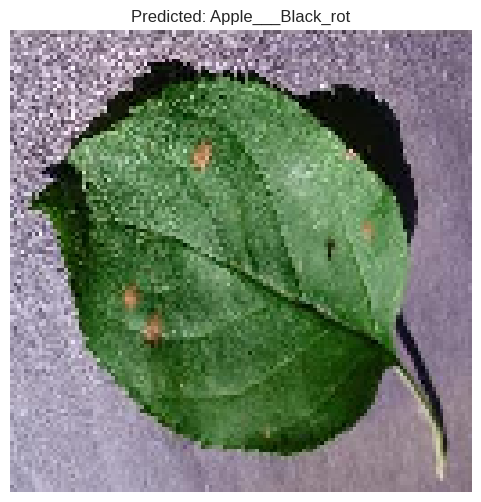

Predicted class: Apple___Black_rot


In [ ]:
def predict_uploaded_image(model_path, img_size, class_labels):
    """
    Upload and predict a new image using the trained model.

    Args:
        model_path (str): Path to the saved best model (.keras).
        img_size (int): Target image size.
        class_labels (list): List of class names.
    """
    model = load_model(model_path)
    uploaded = files.upload()
    for file_name in uploaded.keys():
        print(f"Processing file: {file_name}")
        img = image.load_img(file_name, target_size=(img_size, img_size), color_mode='rgb')
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.0
        predictions = model.predict(img_array)
        predicted_class_index = np.argmax(predictions, axis=1)
        predicted_class_label = class_labels[predicted_class_index[0]]
        plt.figure(figsize=(6, 6))
        plt.imshow(img_array[0])
        plt.title(f"Predicted: {predicted_class_label}")
        plt.axis('off')
        plt.show()
        print("Predicted class:", predicted_class_label)

predict_uploaded_image('keras_model/best_model.keras', IMG_SIZE, class_labels)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


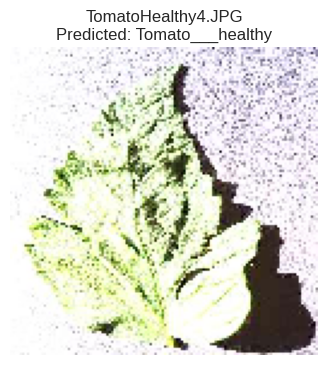

TomatoHealthy4.JPG: Predicted class: Tomato___healthy
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


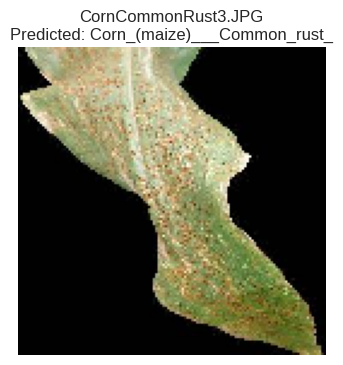

CornCommonRust3.JPG: Predicted class: Corn_(maize)___Common_rust_
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


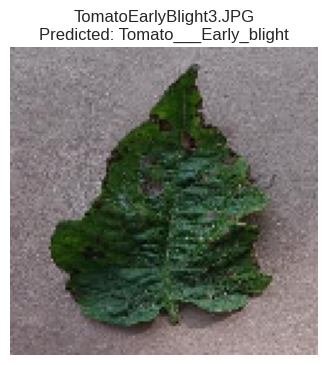

TomatoEarlyBlight3.JPG: Predicted class: Tomato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


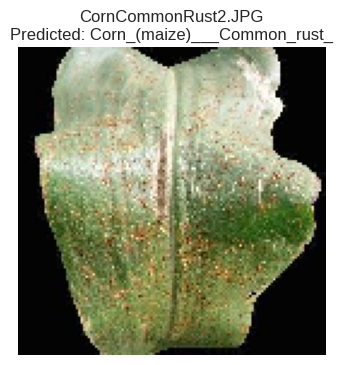

CornCommonRust2.JPG: Predicted class: Corn_(maize)___Common_rust_
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


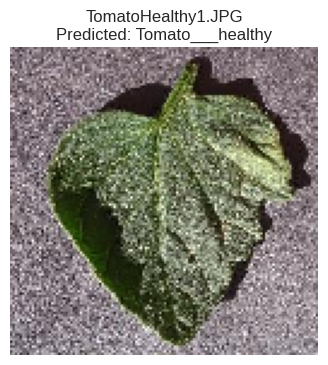

TomatoHealthy1.JPG: Predicted class: Tomato___healthy
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


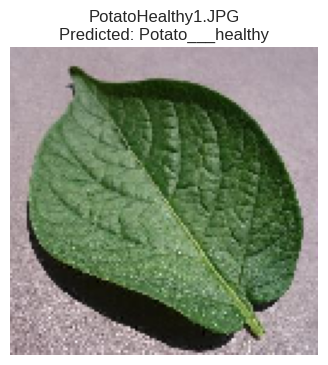

PotatoHealthy1.JPG: Predicted class: Potato___healthy
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


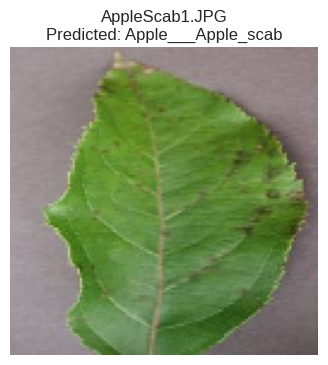

AppleScab1.JPG: Predicted class: Apple___Apple_scab
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


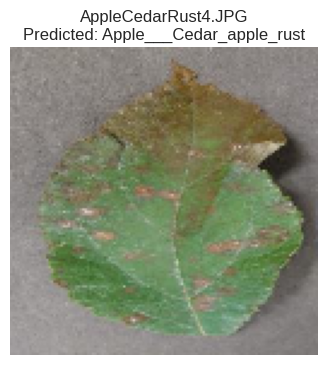

AppleCedarRust4.JPG: Predicted class: Apple___Cedar_apple_rust
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


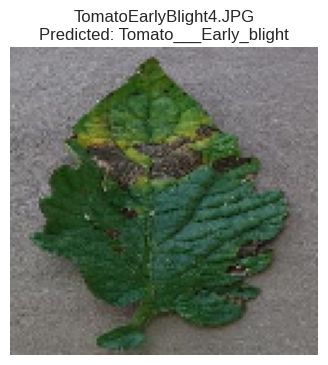

TomatoEarlyBlight4.JPG: Predicted class: Tomato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


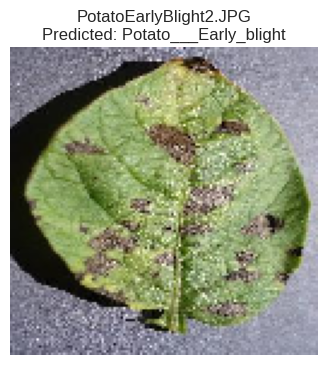

PotatoEarlyBlight2.JPG: Predicted class: Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


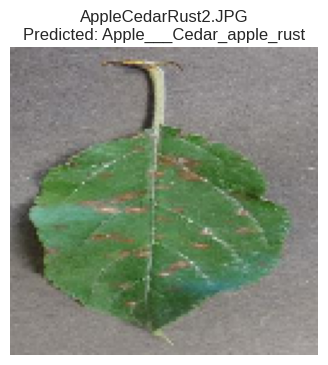

AppleCedarRust2.JPG: Predicted class: Apple___Cedar_apple_rust
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


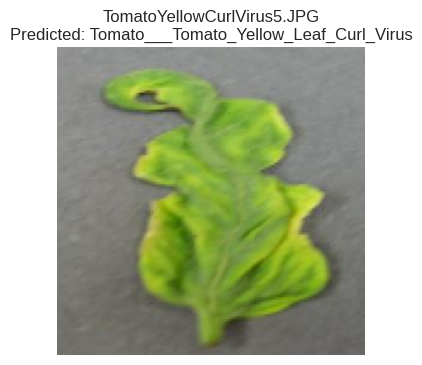

TomatoYellowCurlVirus5.JPG: Predicted class: Tomato___Tomato_Yellow_Leaf_Curl_Virus
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


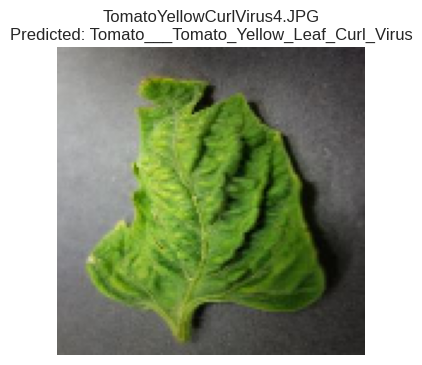

TomatoYellowCurlVirus4.JPG: Predicted class: Tomato___Tomato_Yellow_Leaf_Curl_Virus
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


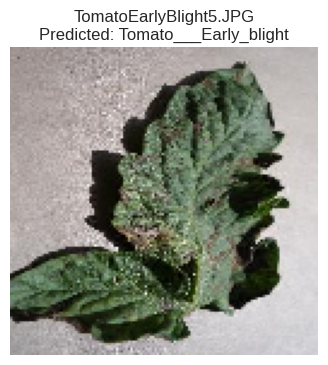

TomatoEarlyBlight5.JPG: Predicted class: Tomato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


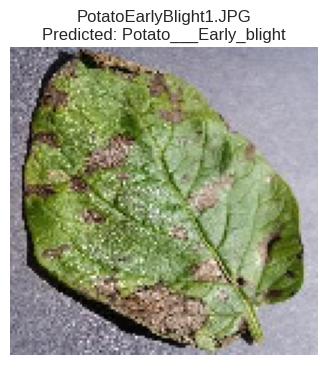

PotatoEarlyBlight1.JPG: Predicted class: Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


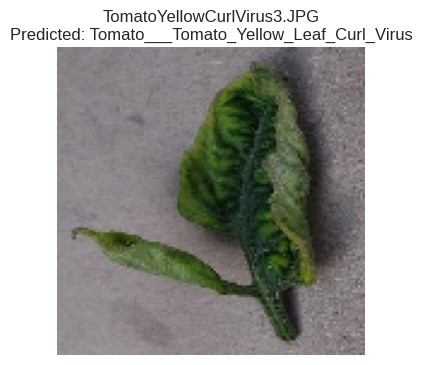

TomatoYellowCurlVirus3.JPG: Predicted class: Tomato___Tomato_Yellow_Leaf_Curl_Virus
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


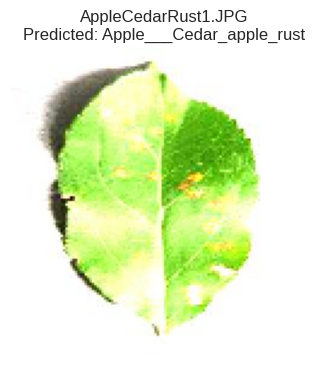

AppleCedarRust1.JPG: Predicted class: Apple___Cedar_apple_rust
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


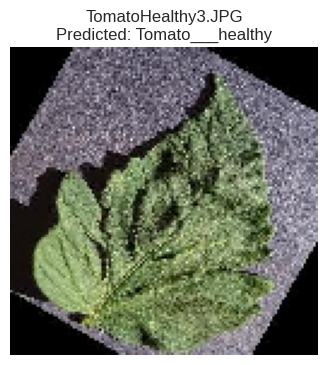

TomatoHealthy3.JPG: Predicted class: Tomato___healthy
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


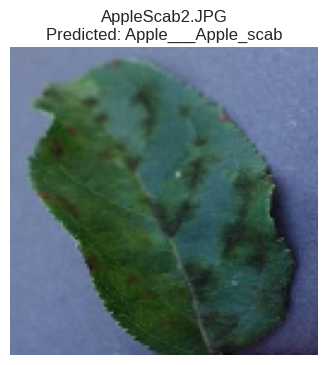

AppleScab2.JPG: Predicted class: Apple___Apple_scab
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


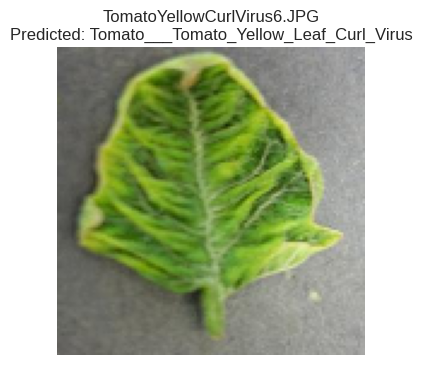

TomatoYellowCurlVirus6.JPG: Predicted class: Tomato___Tomato_Yellow_Leaf_Curl_Virus
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


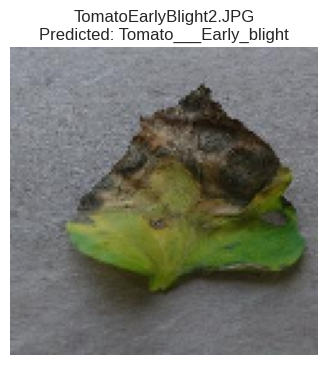

TomatoEarlyBlight2.JPG: Predicted class: Tomato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


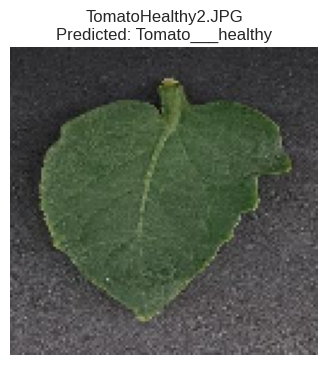

TomatoHealthy2.JPG: Predicted class: Tomato___healthy
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


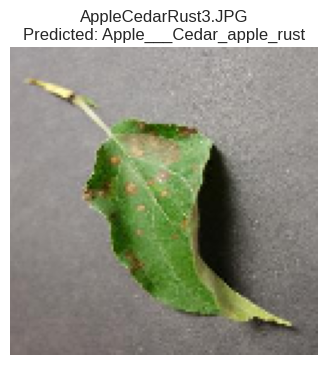

AppleCedarRust3.JPG: Predicted class: Apple___Cedar_apple_rust
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


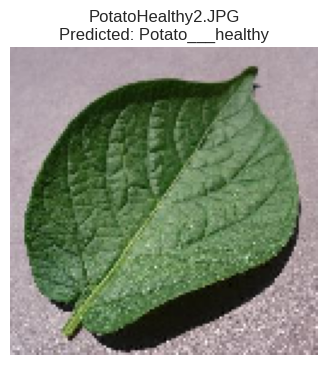

PotatoHealthy2.JPG: Predicted class: Potato___healthy
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


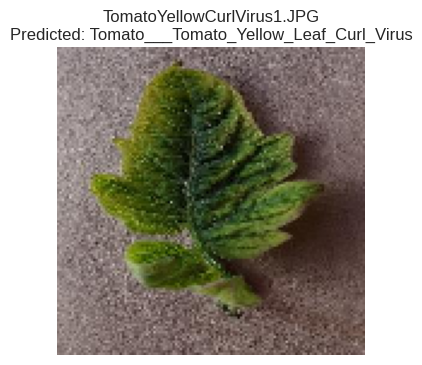

TomatoYellowCurlVirus1.JPG: Predicted class: Tomato___Tomato_Yellow_Leaf_Curl_Virus
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


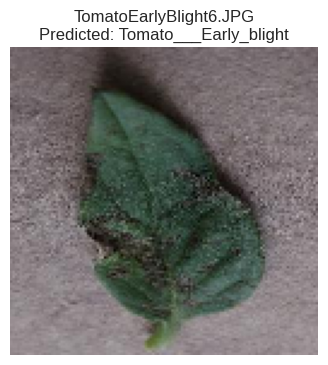

TomatoEarlyBlight6.JPG: Predicted class: Tomato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


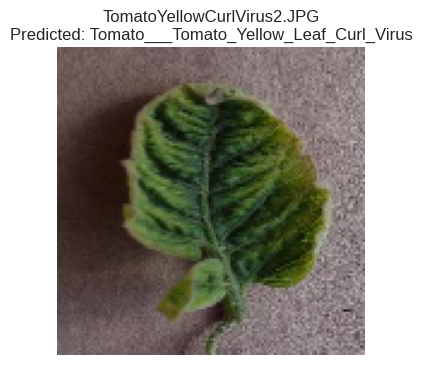

TomatoYellowCurlVirus2.JPG: Predicted class: Tomato___Tomato_Yellow_Leaf_Curl_Virus
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


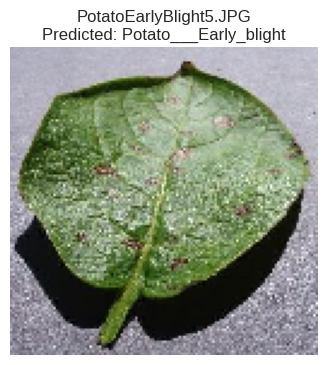

PotatoEarlyBlight5.JPG: Predicted class: Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


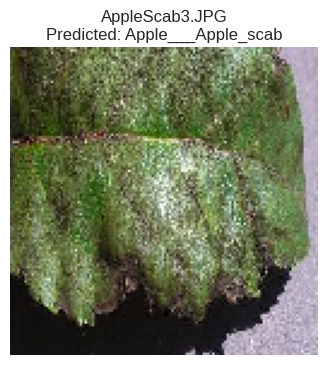

AppleScab3.JPG: Predicted class: Apple___Apple_scab
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


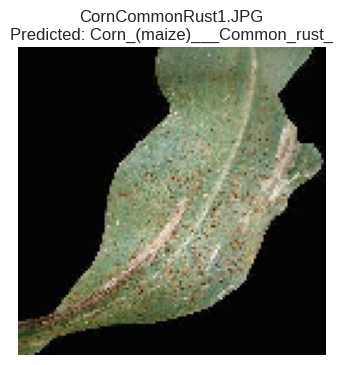

CornCommonRust1.JPG: Predicted class: Corn_(maize)___Common_rust_
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


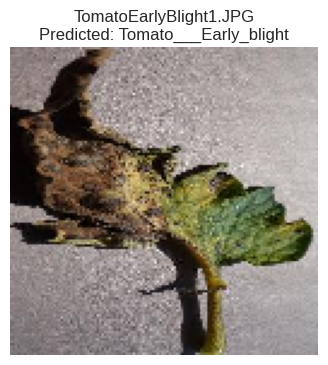

TomatoEarlyBlight1.JPG: Predicted class: Tomato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


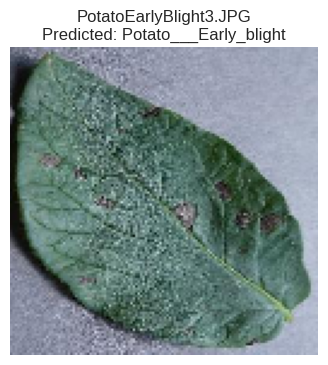

PotatoEarlyBlight3.JPG: Predicted class: Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


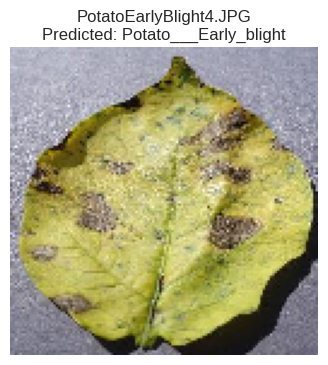

PotatoEarlyBlight4.JPG: Predicted class: Potato___Early_blight


In [ ]:
def predict_from_folder(model_path, folder_path, img_size, class_labels):
    """
    Perform inference on all images in a folder using a trained model.

    Args:
        model_path (str): Path to the trained Keras model (.keras file).
        folder_path (str): Path to the folder containing images for inference.
        img_size (int): Target image size for the model.
        class_labels (list): List of class names corresponding to model outputs.

    This function will:
        - Load the trained model.
        - Iterate through all image files in the specified folder.
        - Preprocess each image and perform prediction.
        - Display each image with its predicted class label.
        - Print the predicted class for each image.
    """
    model = load_model(model_path)
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    if not image_files:
        print("No images found in folder:", folder_path)
        return

    for file_name in image_files:
        file_path = os.path.join(folder_path, file_name)
        img = image.load_img(file_path, target_size=(img_size, img_size), color_mode='rgb')
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.0
        predictions = model.predict(img_array)
        predicted_class_index = np.argmax(predictions, axis=1)
        predicted_class_label = class_labels[predicted_class_index[0]]
        plt.figure(figsize=(4, 4))
        plt.imshow(img_array[0])
        plt.title(f"{file_name}\nPredicted: {predicted_class_label}")
        plt.axis('off')
        plt.show()
        print(f"{file_name}: Predicted class: {predicted_class_label}")
predict_from_folder('keras_model/best_model.keras', 'plant_dataset/test/test', IMG_SIZE, class_labels)

In [ ]:
pip freeze > requirements.txt

In [ ]:
!zip -r plant_disease_model.zip keras_model/ saved_model/ model.tflite tfjs_model/ requirements.txt > /dev/null 2>&1
print("Successfully created zip: plant_disease_model.zip")

Successfully created zip: plant_disease_model.zip
